# Breast Cancer Diagnosis

Dataset source - [kaggle](https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data)

## Import modules

In [102]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.model_selection import GridSearchCV

## Read data

In [103]:
# Read data
df = pd.read_csv("./data/data.csv")
# display all columns
pd.set_option('display.max_columns', 500)
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


## Exploratory data analysis

Diagnosis:
M - malignant
B - benign

Ten real-valued features are computed for each cell nucleus:

1. radius (mean of distances from center to points on the perimeter)
2. texture (standard deviation of gray-scale values)
3. perimeter
4. area
5. smoothness (local variation in radius lengths)
6. compactness (perimeter^2 / area - 1.0)
7. concavity (severity of concave portions of the contour)
8. concave points (number of concave portions of the contour)
9. symmetry
10. fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features.

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

32 столбец полностью пустой и его можно удалить.
Во всех остальных данных пропусков нет.

In [105]:
df.drop(['Unnamed: 32'], axis=1, inplace=True)

Посмотрим основные статистики данных

In [106]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Процент диагнозов в датасете

In [107]:
df.value_counts('diagnosis', normalize=True)

diagnosis
B    0.627417
M    0.372583
dtype: float64

Преобразуем данные, чтобы было удобнее строить графики

In [108]:
features = ['radius', 'texture', 'perimeter', 
                'area', 'smoothness', 'compactness', 
                'concavity', 'concave points', 'symmetry', 
                'fractal_dimension']

long_df = pd.wide_to_long(df, stubnames=features, 
                          i=['id', 'diagnosis'], j='stat', 
                          sep='_', suffix=r'\w+').reset_index().\
                        melt(id_vars=['id', 'diagnosis', 'stat'], 
                             var_name='feature')
long_df.head()

,id,diagnosis,stat,feature,value
0,842302,M,mean,radius,17.9900
1,842302,M,se,radius,1.0950
2,842302,M,worst,radius,25.3800
3,842517,M,mean,radius,20.5700
4,842517,M,se,radius,0.5435


### Distributions

Распределения признаков. Они должны быть близки к нормальному, как в большинстве случаев в естественном мире.

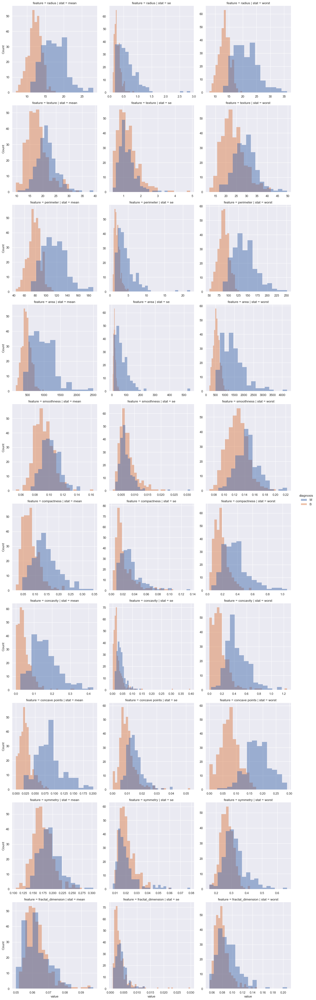

In [109]:
sns.displot(data=long_df, x='value', hue='diagnosis', 
            col='stat', row='feature', kind='hist', 
            facet_kws={'sharey':False, 'sharex': False}, 
            common_bins=False)
plt.show()

### Correlation

Нарисуем HeatMap корреляций. Т.к. даных много мы отобразим все порциями 10 х 10

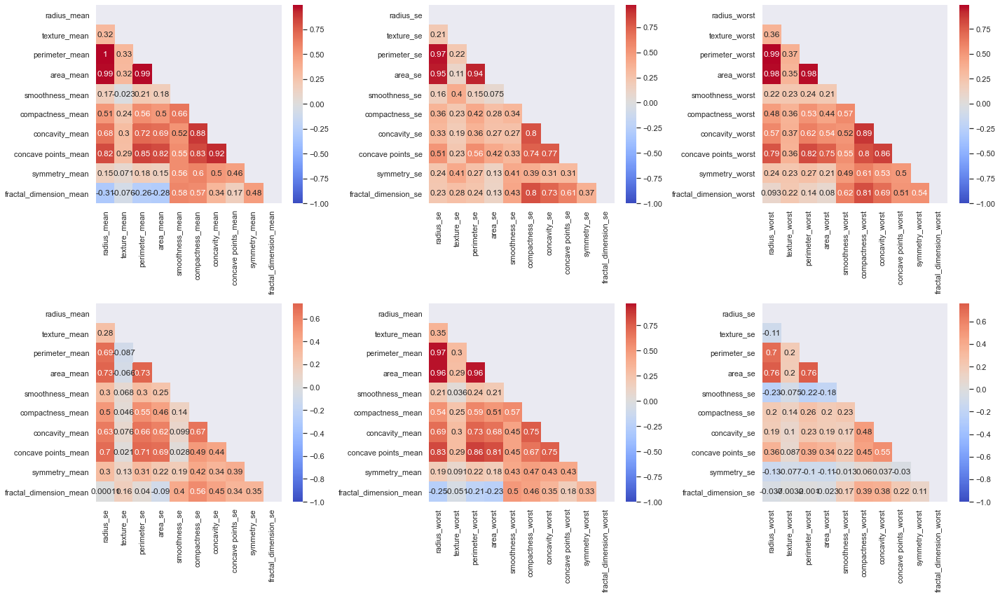

In [110]:
# Calculate correlation
corr = df.drop('id', axis=1).corr()
# Create Figure and set parameters
fig, axes = plt.subplots(2, 3)
fig.set_size_inches(20, 12)
# Create pallete
pal = sns.color_palette("coolwarm", 10000)
# Division of rows and columns in correlation matrix to construct parts of heatmap
rows = [(0, 10), (10, 20), (20, 30), (0, 10), (0, 10), (10, 20)]
cols = [(0, 10), (10, 20), (20, 30), (10, 20), (20, 30), (20, 30)]
# Mask
mask = np.triu(np.ones((10, 10), dtype=np.bool))
# Visualize
for row, col, ax in zip(rows, cols, axes.flatten()):
    corr_part = corr.iloc[row[0]:row[1], col[0]:col[1]]
    sns.heatmap(corr_part, annot=True, cmap=pal, mask=mask, vmin=-1, center=0, ax=ax)
# Automatically adjust subplots layout
fig.tight_layout()
plt.show()

Отберем признаки с высокой корреляцией ($\geq 0.6$)

In [111]:
# Initialize dictionary {column_name: highly correlated columns list}
high_corr = dict()
# Threshold value for cor
thres_r = 0.6
# Get highly correlated values
for i, row in corr.reset_index(drop=True).iterrows():
    # select rows to avoid repeatition
    r = row[i+1:]
    # get correlated column names
    hr = list(r[np.abs(r) >= thres_r].index)
    # ignore empty lists
    if len(hr) != 0:
        high_corr[row.index[i]] = list(r[r >= thres_r].index)
#high_corr

Построим scatter plot между отобранными колонками. Чтобы лучше увидеть характер зависимости визуализируем x vs. y и y vs. x

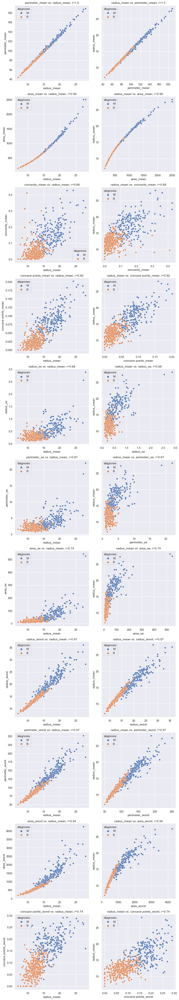

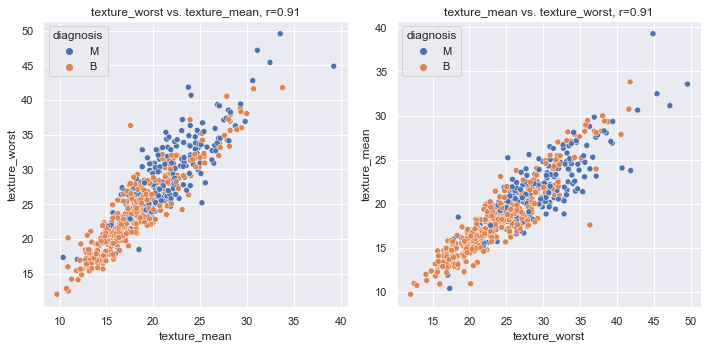

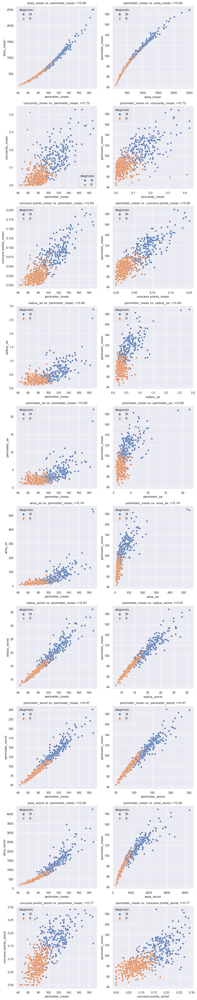

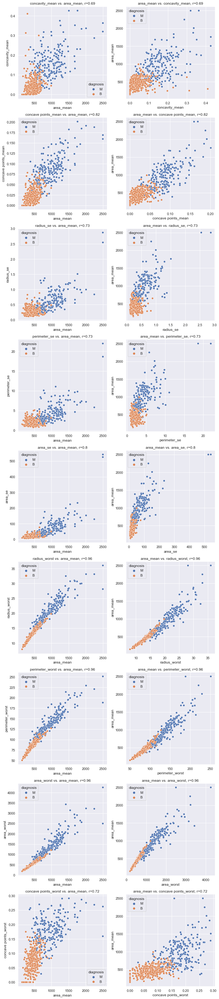

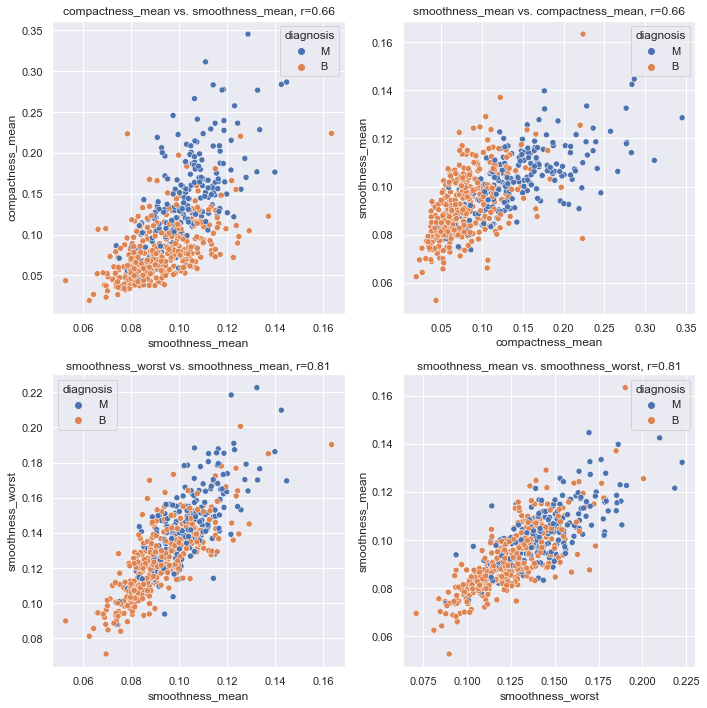

...

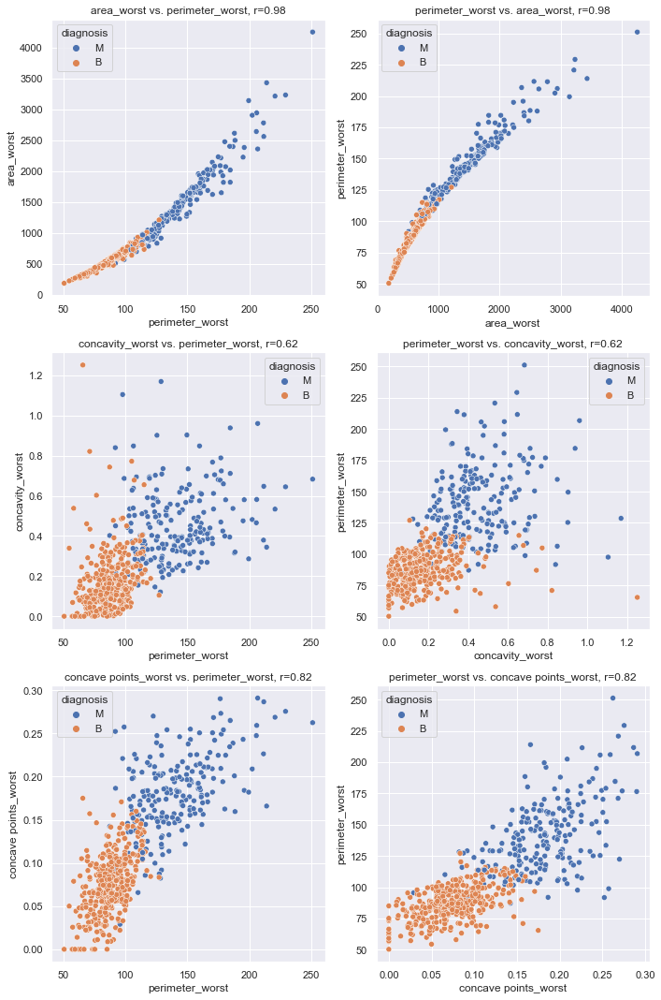

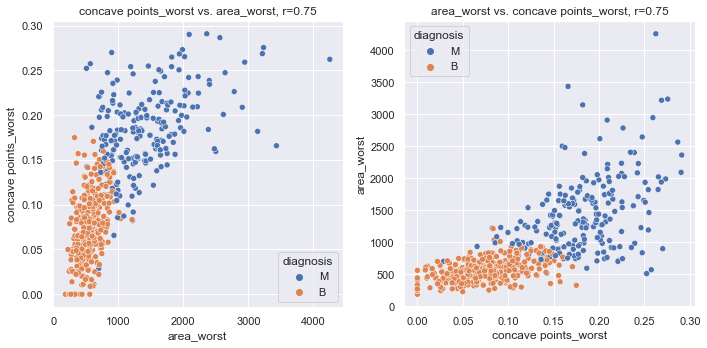

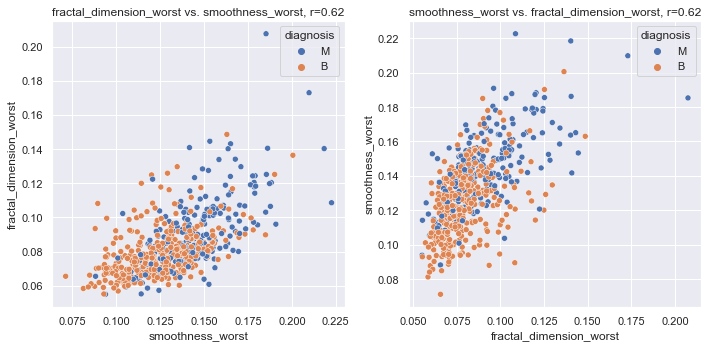

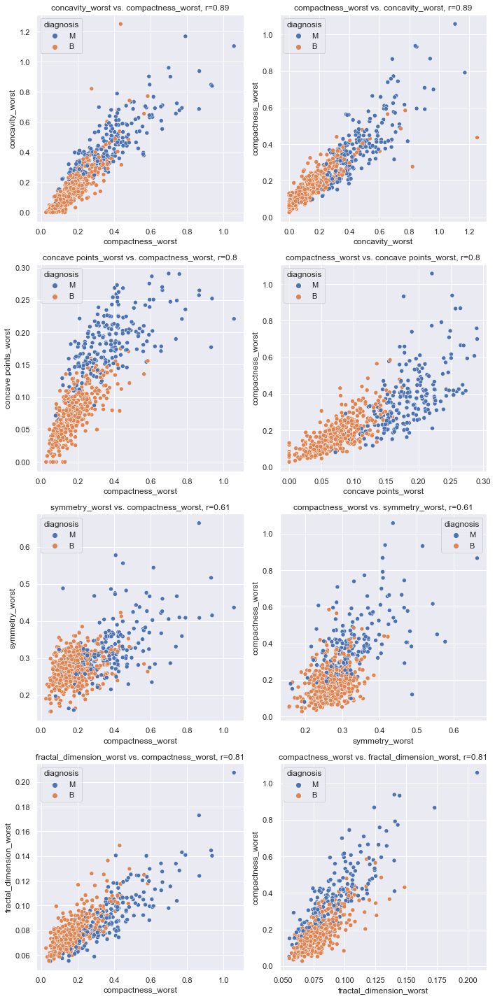

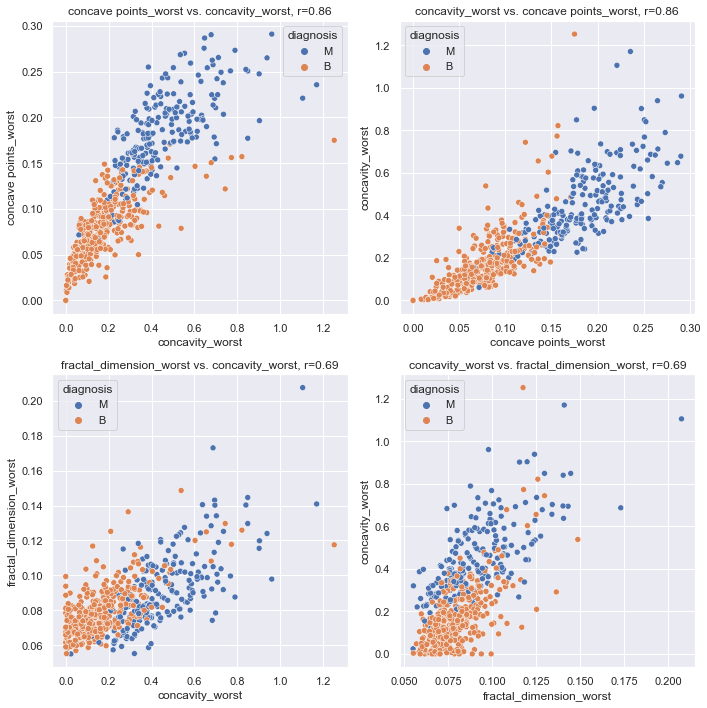

In [112]:
for key in high_corr.keys():
    ftrs = high_corr[key]
    # figure of size num of higly corr features x 2
    fig, axes = plt.subplots(len(ftrs), 2)
    if axes.ndim == 1:
        axes = axes.reshape((1,2))
    # Figure size
    fig.set_size_inches(2 * 5, axes.shape[0] * 5)
    # Plotting
    for ftr, ax in zip(ftrs, axes):
        # get correlation
        r = round(corr.loc[ftr, key], 2)
        # axes titles
        ax[0].set_title(f'{ftr} vs. {key}, r={r}')
        ax[1].set_title(f'{key} vs. {ftr}, r={r}')
        # create scatter plots
        sns.scatterplot(data=df, x=key, y=ftr, hue='diagnosis', ax=ax[0])        
        sns.scatterplot(data=df, y=key, x=ftr, hue='diagnosis', ax=ax[1])
    fig.tight_layout()
    plt.show()

Не для всех случаем зависимость линейная, например radius_mean и area_mean или  perimeter_mean и concave points worst

### Boxplots

Теперь постоим boxplot для определения по каким признакам лучше всего отделять виды новообразований.

In [113]:
# normalization
long_df['feature_stat'] = long_df[['feature', 'stat']].agg('_'.join, axis=1)
nlong = long_df.pivot(index=['id', 'diagnosis'], columns=['feature_stat'], values='value').\
    apply(zscore).reset_index().melt(id_vars=['id', 'diagnosis'], 
                                     var_name='feature_stat')
# calculate difference in distribution to sort by in boxplot
qcomp = nlong.groupby(['feature_stat', 'diagnosis'])['value'].\
    quantile([0.25, 0.5, 0.75]).unstack().reset_index()
qcomp['iqr'] = qcomp[0.75] - qcomp[0.25]
qcomp = qcomp.groupby('feature_stat')[0.25, 0.5, 0.75, 'iqr'].\
    agg(np.diff).apply(np.abs).sum(axis=1).sort_values(ascending=False)


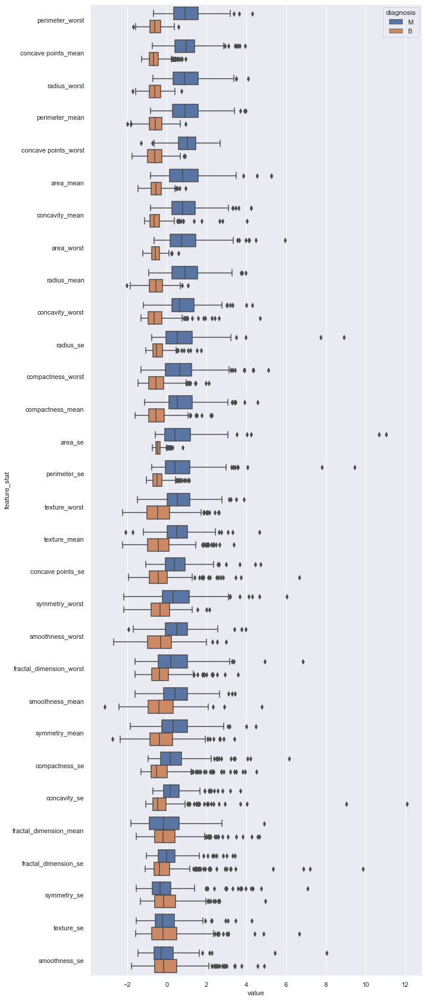

In [114]:
fig = plt.figure()
fig.set_size_inches(10, 30)
sns.boxplot(data=nlong, y='feature_stat', x='value', hue='diagnosis', order=qcomp.index)
plt.show()

Лучшие фичи для предсказания типа новообразования:
- perimeter_worst
- concave points_mean
- radius_worst
- perimeter_mean
- concave points_worst
- area_mean
- concavity_mean
- area_worst
- radius_mean
- concavity_worst
- radius_se
- compactness_worst
- compactness_mean
- area_se
- perimeter_se

## KNN
Разделим выборку и нормлизуем данные, т.к.масштабы между фичами очень разные.

In [115]:
df['diagnosis'] = df.diagnosis.replace({'M': 1, 'B': 0})
# Divide to train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(['id', 'diagnosis'], axis=1), 
    df['diagnosis'],
    test_size=0.3, 
    random_state=7)

# Normalize data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [116]:
print(y_train.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

0    0.605528
1    0.394472
Name: diagnosis, dtype: float64
0    0.678363
1    0.321637
Name: diagnosis, dtype: float64


### Default

Обучим модель с дефолтными параметрами и оценим ее качество

In [118]:
# train model
knn_1 = KNeighborsClassifier().fit(X_train, y_train)
y_pred = knn_1.predict(X_test)

# rate
# df for comparison
knn_comp = pd.DataFrame([dict(
    description='default knn',
    accuracy=accuracy_score(y_test, y_pred),
    prescision=precision_score(y_test, y_pred),
    recall=recall_score(y_test, y_pred),
    f1_score=f1_score(y_test, y_pred)
)])
knn_comp

,description,accuracy,prescision,recall,f1_score
0,default knn,0.959064,1.0,0.872727,0.932039


In [119]:
def draw_roc_auc(fpr, tpr, auc, ax):
    ax.plot([0, 1], [0, 1], linestyle='--')
    ax.plot(fpr, tpr, label=f'ROC curve (auc = {auc})')
    ax.set(
        xlabel = 'False Positive Rate',
        ylabel = 'True Positive Rate'
    )
    ax.legend(loc='lower right')

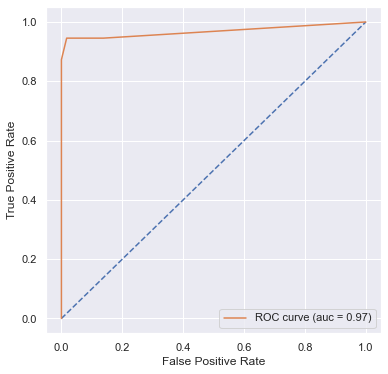

In [120]:
y_pred_prob = knn_1.predict_proba(X_test) [:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
auc1 = auc(fpr, tpr)
fig, ax = plt.subplots()
fig.set_size_inches(6,6)
sns.set_theme()
draw_roc_auc(fpr, tpr, round(auc1, 2), ax)
plt.show()

### Cross validation

В задаче классификации новообразования критически важно не пропустить злокачественную опухоль, поэтому максимизировать будем метрику recall

In [81]:
from sklearn.model_selection import GridSearchCV

param_grid = {
        'n_neighbors': range(1, 51),
        'p': range(1, 4)
}
knn = KNeighborsClassifier()

np.random.seed(7)

grid_search = GridSearchCV(knn, param_grid, cv=10, scoring='recall', verbose=1).fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV k: {}, best CV p: {}".format(
    grid_search.best_score_, 
    grid_search.best_estimator_.n_neighbors, 
    grid_search.best_estimator_.p)
)

Обучим модель на подобранных гиперпараметрах: k=3, p=1 (расстояния считаются по формуле манхетеннского расстояния)

In [123]:
# train model
k = grid_search.best_estimator_.n_neighbors
p = grid_search.best_estimator_.p
knn_2 = KNeighborsClassifier(n_neighbors=k, p=p).fit(X_train, y_train)
y_pred = knn_2.predict(X_test)
# rate
pd.concat([knn_comp, pd.DataFrame([dict(
    description=f'knn (k={k}, p={p})',
    accuracy=accuracy_score(y_test, y_pred),
    prescision=precision_score(y_test, y_pred),
    recall=recall_score(y_test, y_pred),
    f1_score=f1_score(y_test, y_pred)
    )])])

,description,accuracy,prescision,recall,f1_score
0,default knn,0.959064,1.0,0.872727,0.932039
0,"knn (k=3, p=1)",0.970760,1.0,0.909091,0.952381


После подбора гиперпараметров качество модели улучшилось по всем метрикам.

## Logistic Regression